In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

from collections import Counter

%matplotlib inline

In [3]:
blob_df = pd.read_csv("blob.csv")
dart_df = pd.read_csv("dart.csv")
outliers_df = pd.read_csv("outliers.csv")
spiral2_df = pd.read_csv("spiral2.csv")
basic2_df = pd.read_csv("basic2.csv")
boxes3_df = pd.read_csv("boxes3.csv")

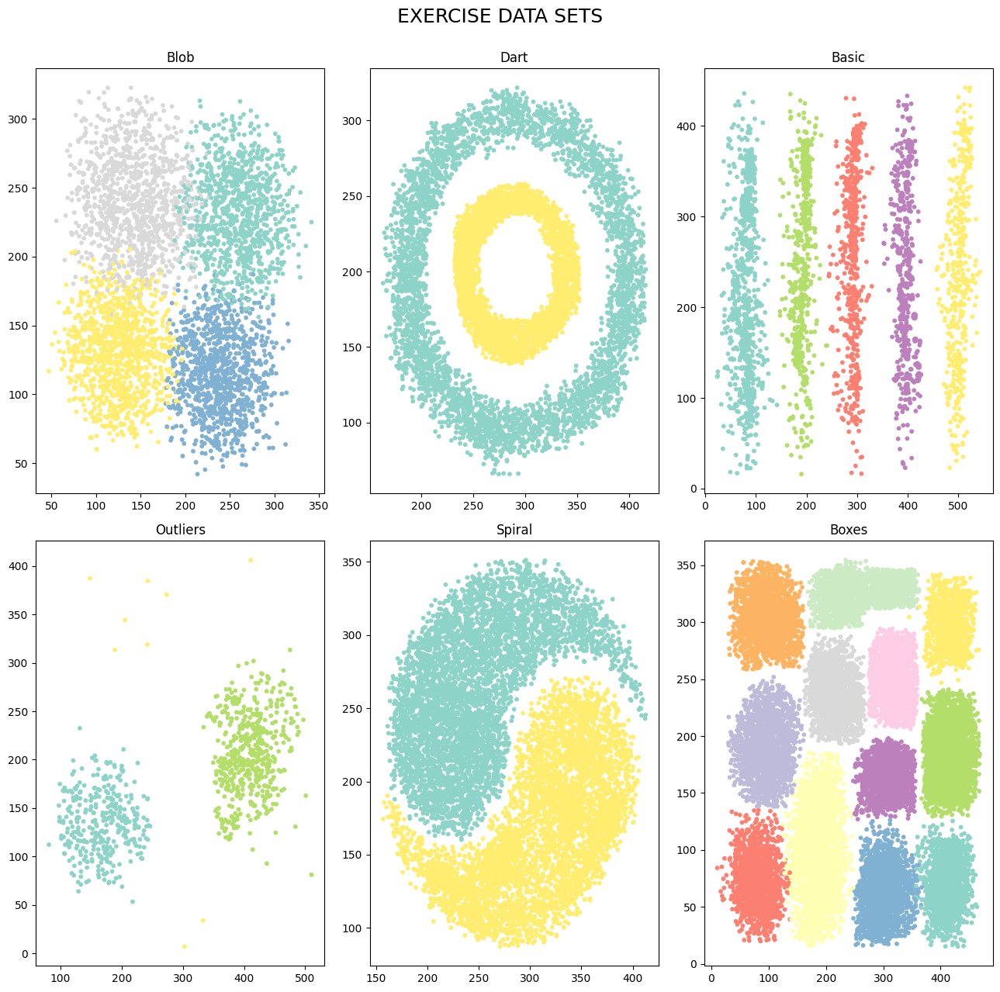

In [4]:
fig, axes = plt.subplots(nrows=2, ncols=3,figsize=(13,13))
fig.suptitle('EXERCISE DATA SETS\n', size = 18)

axes[0,0].scatter(blob_df['x'], blob_df['y'], c=blob_df['color'], s=10, cmap = "Set3")
axes[0,0].set_title("Blob");

axes[0,1].scatter(dart_df['x'], dart_df['y'], c=dart_df['color'], s=10, cmap = "Set3")
axes[0,1].set_title("Dart");

axes[0,2].scatter(basic2_df['x'], basic2_df['y'], c=basic2_df['color'], s=10, cmap = "Set3")
axes[0,2].set_title("Basic");

axes[1,0].scatter(outliers_df['x'], outliers_df['y'], c=outliers_df['color'], s=10, cmap = "Set3")
axes[1,0].set_title("Outliers");

axes[1,1].scatter(spiral2_df['x'], spiral2_df['y'], c=spiral2_df['color'], s=10, cmap = "Set3")
axes[1,1].set_title("Spiral");

axes[1,2].scatter(boxes3_df['x'], boxes3_df['y'], c=boxes3_df['color'], s=10, cmap = "Set3")
axes[1,2].set_title("Boxes");

plt.tight_layout()

In [5]:
df_blob_kmeans = blob_df.copy()
df_dart_kmeans = dart_df.copy()
df_basic_kmeans = basic2_df.copy()
df_outliers_kmeans = outliers_df.copy()
df_spiral2_kmeans = spiral2_df.copy()
df_boxes3_kmeans = boxes3_df.copy()

In [6]:
df_blob_kmeans.drop(['color'], axis = 1, inplace =True)
df_dart_kmeans.drop(['color'], axis = 1, inplace =True)
df_basic_kmeans.drop(['color'], axis = 1, inplace =True)
df_outliers_kmeans.drop(['color'], axis = 1, inplace =True)
df_spiral2_kmeans.drop(['color'], axis = 1, inplace =True)
df_boxes3_kmeans.drop(['color'], axis = 1, inplace =True)

In [7]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters = 6, init = 'k-means++', random_state = 42)
# y_kmeans = kmeans.fit_predict(df_kmeans)

kmeans_blob = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
kmeans_dart = KMeans(n_clusters = 2, init = 'k-means++', random_state = 42)
kmeans_basic = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
kmeans_outliers = KMeans(n_clusters = 3, init = 'k-means++', random_state = 42)
kmeans_spiral2 = KMeans(n_clusters = 2, init = 'k-means++', random_state = 42)
kmeans_boxes3 = KMeans(n_clusters = 12, init = 'k-means++', random_state = 42)

y_kmeans_blob = kmeans_blob.fit_predict(df_blob_kmeans)
y_kmeans_dart = kmeans_dart.fit_predict(df_dart_kmeans)
y_kmeans_basic = kmeans_basic.fit_predict(df_basic_kmeans)
y_kmeans_outliers = kmeans_outliers.fit_predict(df_outliers_kmeans)
y_kmeans_spiral2 = kmeans_spiral2.fit_predict(df_spiral2_kmeans)
y_kmeans_boxes3 = kmeans_boxes3.fit_predict(df_boxes3_kmeans)

/Users/carbon/miniconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/carbon/miniconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/carbon/miniconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/carbon/miniconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/carbo

In [8]:
df_blob_kmeans['Cluster'] = y_kmeans_blob
df_dart_kmeans['Cluster'] = y_kmeans_dart
df_basic_kmeans['Cluster'] = y_kmeans_basic
df_outliers_kmeans['Cluster'] = y_kmeans_outliers
df_spiral2_kmeans['Cluster'] = y_kmeans_spiral2
df_boxes3_kmeans['Cluster'] = y_kmeans_boxes3

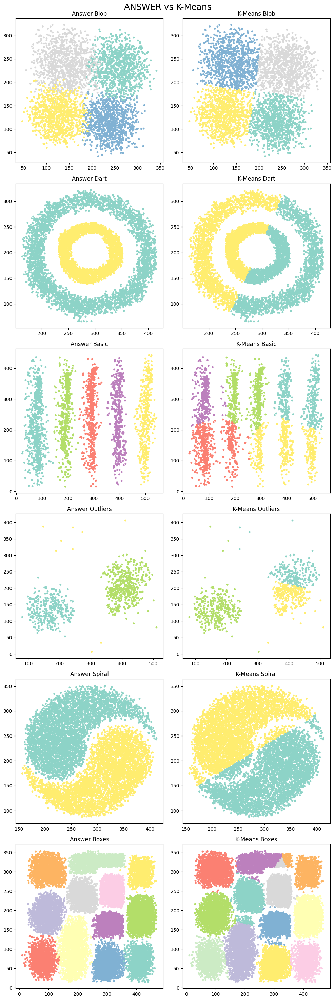

In [9]:
fig, axes = plt.subplots(nrows=6, ncols=2,figsize=(10,30))
fig.suptitle('ANSWER vs K-Means\n', size = 18)

axes[0,0].scatter(blob_df['x'], blob_df['y'], c=blob_df['color'], s=10, cmap = "Set3")
axes[0,0].set_title("Answer Blob");
axes[0,1].scatter(df_blob_kmeans['x'], df_blob_kmeans['y'], c=df_blob_kmeans['Cluster'], s=10, cmap = "Set3")
axes[0,1].set_title("K-Means Blob");


axes[1,0].scatter(dart_df['x'], dart_df['y'], c=dart_df['color'], s=10, cmap = "Set3")
axes[1,0].set_title("Answer Dart");
axes[1,1].scatter(df_dart_kmeans['x'], df_dart_kmeans['y'], c=df_dart_kmeans['Cluster'], s=10, cmap = "Set3")
axes[1,1].set_title("K-Means Dart");

axes[2,0].scatter(basic2_df['x'], basic2_df['y'], c=basic2_df['color'], s=10, cmap = "Set3")
axes[2,0].set_title("Answer Basic");
axes[2,1].scatter(df_basic_kmeans['x'], df_basic_kmeans['y'], c=df_basic_kmeans['Cluster'], s=10, cmap = "Set3")
axes[2,1].set_title("K-Means Basic");

axes[3,0].scatter(outliers_df['x'], outliers_df['y'], c=outliers_df['color'], s=10, cmap = "Set3")
axes[3,0].set_title("Answer Outliers");
axes[3,1].scatter(df_outliers_kmeans['x'], df_outliers_kmeans['y'], c=df_outliers_kmeans['Cluster'], s=10, cmap = "Set3")
axes[3,1].set_title("K-Means Outliers");

axes[4,0].scatter(spiral2_df['x'], spiral2_df['y'], c=spiral2_df['color'], s=10, cmap = "Set3")
axes[4,0].set_title("Answer Spiral");
axes[4,1].scatter(df_spiral2_kmeans['x'], df_spiral2_kmeans['y'], c=df_spiral2_kmeans['Cluster'], s=10, cmap = "Set3")
axes[4,1].set_title("K-Means Spiral");

axes[5,0].scatter(boxes3_df['x'], boxes3_df['y'], c=boxes3_df['color'], s=10, cmap = "Set3")
axes[5,0].set_title("Answer Boxes");
axes[5,1].scatter(df_boxes3_kmeans['x'], df_boxes3_kmeans['y'], c=df_boxes3_kmeans['Cluster'], s=10, cmap = "Set3")
axes[5,1].set_title("K-Means Boxes");

plt.tight_layout()

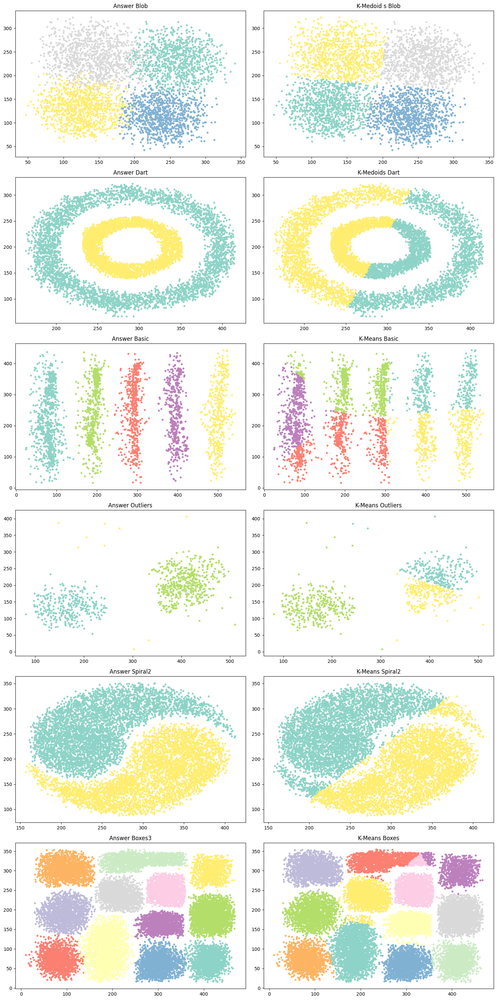

In [10]:
# 1. K-Medoid
# 2. K-Mode
# 3. Agglomerative Clustering
# 4. BIRCH
# 5. CHAMELEON
# 6. DBSCAN

#implement kmediod on all the 6 dataset and visualize the result
df_blob_kmediods = blob_df.copy()
df_dart_kmediods = dart_df.copy()
df_basic_kmediods = basic2_df.copy()
df_outliers_kmediods = outliers_df.copy()
df_spiral2_kmediods = spiral2_df.copy()
df_boxes3_kmediods = boxes3_df.copy()

df_blob_kmediods.drop(['color'], axis = 1, inplace =True)
df_dart_kmediods.drop(['color'], axis = 1, inplace =True)
df_basic_kmediods.drop(['color'], axis = 1, inplace =True)
df_outliers_kmediods.drop(['color'], axis = 1, inplace =True)
df_spiral2_kmediods.drop(['color'], axis = 1, inplace =True)
df_boxes3_kmediods.drop(['color'], axis = 1, inplace =True)


# K-Medoids
from sklearn_extra.cluster import KMedoids


kmediod= KMedoids(n_clusters = 6, init = 'k-medoids++', random_state = 42)
kmedoids_blob = KMedoids(n_clusters = 4, init = 'k-medoids++', random_state = 42)
kmedoids_dart = KMedoids(n_clusters = 2, init = 'k-medoids++', random_state = 42)
kmedoids_basic = KMedoids(n_clusters = 5, init = 'k-medoids++', random_state = 42)
kmedoids_outliers = KMedoids(n_clusters = 3, init = 'k-medoids++', random_state = 42)
kmedoids_spiral2 = KMedoids(n_clusters = 2, init = 'k-medoids++', random_state = 42)
kmedoids_boxes3 = KMedoids(n_clusters = 12, init = 'k-medoids++', random_state = 42)

y_kmedoids_blob = kmedoids_blob.fit_predict(df_blob_kmediods)
y_kmedoids_dart = kmedoids_dart.fit_predict(df_dart_kmediods)
y_kmedoids_basic = kmedoids_basic.fit_predict(df_basic_kmediods)
y_kmedoids_outliers = kmedoids_outliers.fit_predict(df_outliers_kmediods)
y_kmedoids_spiral2 = kmedoids_spiral2.fit_predict(df_spiral2_kmediods)
y_kmedoids_boxes3 = kmedoids_boxes3.fit_predict(df_boxes3_kmediods)

df_blob_kmediods['Cluster'] = y_kmedoids_blob
df_dart_kmediods['Cluster'] = y_kmedoids_dart
df_basic_kmediods['Cluster'] = y_kmedoids_basic
df_outliers_kmediods['Cluster'] = y_kmedoids_outliers
df_spiral2_kmediods['Cluster'] = y_kmedoids_spiral2
df_boxes3_kmediods['Cluster'] = y_kmedoids_boxes3

#visualize

fig, axes = plt.subplots(6,2, figsize=(15,30))
axes[0,0].scatter(blob_df['x'], blob_df['y'], c=blob_df['color'], s=10, cmap = "Set3")
axes[0,0].set_title("Answer Blob");

axes[0,1].scatter(df_blob_kmediods['x'], df_blob_kmediods['y'], c=df_blob_kmediods['Cluster'], s=10, cmap = "Set3")
axes[0,1].set_title("K-Medoid s Blob");

axes[1,0].scatter(dart_df['x'], dart_df['y'], c=dart_df['color'], s=10, cmap = "Set3")
axes[1,0].set_title("Answer Dart");

axes[1,1].scatter(df_dart_kmediods['x'], df_dart_kmediods['y'], c=df_dart_kmediods['Cluster'], s=10, cmap = "Set3")
axes[1,1].set_title("K-Medoids Dart");

axes[2,0].scatter(basic2_df['x'], basic2_df['y'], c=basic2_df['color'], s=10, cmap = "Set3")
axes[2,0].set_title("Answer Basic");

axes[2,1].scatter(df_basic_kmediods['x'], df_basic_kmediods['y'], c=df_basic_kmediods['Cluster'], s=10, cmap = "Set3")
axes[2,1].set_title("K-Means Basic");

axes[3,0].scatter(outliers_df['x'], outliers_df['y'], c=outliers_df['color'], s=10, cmap = "Set3")
axes[3,0].set_title("Answer Outliers");

axes[3,1].scatter(df_outliers_kmediods['x'], df_outliers_kmediods['y'], c=df_outliers_kmediods['Cluster'], s=10, cmap = "Set3")
axes[3,1].set_title("K-Means Outliers");

axes[4,0].scatter(spiral2_df['x'], spiral2_df['y'], c=spiral2_df['color'], s=10, cmap = "Set3")
axes[4,0].set_title("Answer Spiral2");

axes[4,1].scatter(df_spiral2_kmediods['x'], df_spiral2_kmediods['y'], c=df_spiral2_kmediods['Cluster'], s=10, cmap = "Set3")
axes[4,1].set_title("K-Means Spiral2");

axes[5,0].scatter(boxes3_df['x'], boxes3_df['y'], c=boxes3_df['color'], s=10, cmap = "Set3")
axes[5,0].set_title("Answer Boxes3");

axes[5,1].scatter(df_boxes3_kmediods['x'], df_boxes3_kmediods['y'], c=df_boxes3_kmediods['Cluster'], s=10, cmap = "Set3")
axes[5,1].set_title("K-Means Boxes");

plt.tight_layout()






Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 8164.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 8164.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 8164.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 8164.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 8164.0
Best run was number 1
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 14552.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 14552.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...


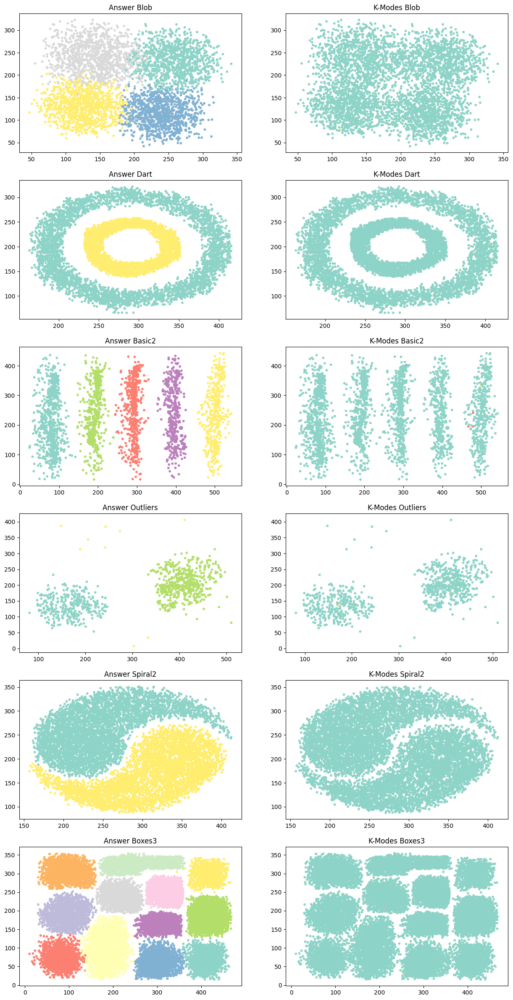

In [28]:
from kmodes.kmodes import KModes
# implement k-mode clustering on all the datasets
df_blob_kmodes = blob_df.copy()
df_dart_kmodes = dart_df.copy()
df_basic_kmodes = basic2_df.copy()
df_outliers_kmodes = outliers_df.copy()
df_spiral2_kmodes = spiral2_df.copy()
df_boxes3_kmodes = boxes3_df.copy()

df_blob_kmodes.drop(['color'], axis=1, inplace=True)
df_dart_kmodes.drop(['color'], axis=1, inplace=True)
df_basic_kmodes.drop(['color'], axis=1, inplace=True)
df_outliers_kmodes.drop(['color'], axis=1, inplace=True)
df_spiral2_kmodes.drop(['color'], axis=1, inplace=True)
df_boxes3_kmodes.drop(['color'], axis=1, inplace=True)

kmodes_blob = KModes(n_clusters=4, init='Huang', n_init=5, verbose=1)
kmodes_dart = KModes(n_clusters=2, init='Huang', n_init=5, verbose=1)
kmodes_basic = KModes(n_clusters=5, init='Huang', n_init=5, verbose=1)
kmodes_outliers = KModes(n_clusters=3, init='Huang', n_init=5, verbose=1)
kmodes_spiral2 = KModes(n_clusters=2, init='Huang', n_init=5, verbose=1)
kmodes_boxes3 = KModes(n_clusters=12, init='Huang', n_init=5, verbose=1)

y_kmodes_blob = kmodes_blob.fit_predict(df_blob_kmodes)
y_kmodes_dart = kmodes_dart.fit_predict(df_dart_kmodes)
y_kmodes_basic = kmodes_basic.fit_predict(df_basic_kmodes)
y_kmodes_outliers = kmodes_outliers.fit_predict(df_outliers_kmodes)
y_kmodes_spiral2 = kmodes_spiral2.fit_predict(df_spiral2_kmodes)
y_kmodes_boxes3 = kmodes_boxes3.fit_predict(df_boxes3_kmodes)

#visualizing the result
fig,axes=plt.subplots(6,2,figsize=(15,30))

axes[0,0].scatter(blob_df['x'], blob_df['y'], c=blob_df['color'], s=10, cmap = "Set3")
axes[0,0].set_title("Answer Blob");
axes[0,1].scatter(df_blob_kmodes['x'], df_blob_kmodes['y'], c=y_kmodes_blob, s=10, cmap = "Set3")
axes[0,1].set_title("K-Modes Blob");

axes[1,0].scatter(dart_df['x'], dart_df['y'], c=dart_df['color'], s=10, cmap = "Set3")
axes[1,0].set_title("Answer Dart");

axes[1,1].scatter(df_dart_kmodes['x'], df_dart_kmodes['y'], c=y_kmodes_dart, s=10, cmap = "Set3")
axes[1,1].set_title("K-Modes Dart");

axes[2,0].scatter(basic2_df['x'], basic2_df['y'], c=basic2_df['color'], s=10, cmap = "Set3")
axes[2,0].set_title("Answer Basic2");

axes[2,1].scatter(df_basic_kmodes['x'], df_basic_kmodes['y'], c=y_kmodes_basic, s=10, cmap = "Set3")
axes[2,1].set_title("K-Modes Basic2");

axes[3,0].scatter(outliers_df['x'], outliers_df['y'], c=outliers_df['color'], s=10, cmap = "Set3")
axes[3,0].set_title("Answer Outliers");

axes[3,1].scatter(df_outliers_kmodes['x'], df_outliers_kmodes['y'], c=y_kmodes_outliers, s=10, cmap = "Set3")
axes[3,1].set_title("K-Modes Outliers");

axes[4,0].scatter(spiral2_df['x'], spiral2_df['y'], c=spiral2_df['color'], s=10, cmap = "Set3")
axes[4,0].set_title("Answer Spiral2");

axes[4,1].scatter(df_spiral2_kmodes['x'], df_spiral2_kmodes['y'], c=y_kmodes_spiral2, s=10, cmap = "Set3")
axes[4,1].set_title("K-Modes Spiral2");

axes[5,0].scatter(boxes3_df['x'], boxes3_df['y'], c=boxes3_df['color'], s=10, cmap = "Set3")
axes[5,0].set_title("Answer Boxes3");

axes[5,1].scatter(df_boxes3_kmodes['x'], df_boxes3_kmodes['y'], c=y_kmodes_boxes3, s=10, cmap = "Set3")
axes[5,1].set_title("K-Modes Boxes3");



/Users/carbon/miniconda3/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/carbon/miniconda3/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/carbon/miniconda3/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/carbon/miniconda3/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/carbon/miniconda3/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:983: FutureW

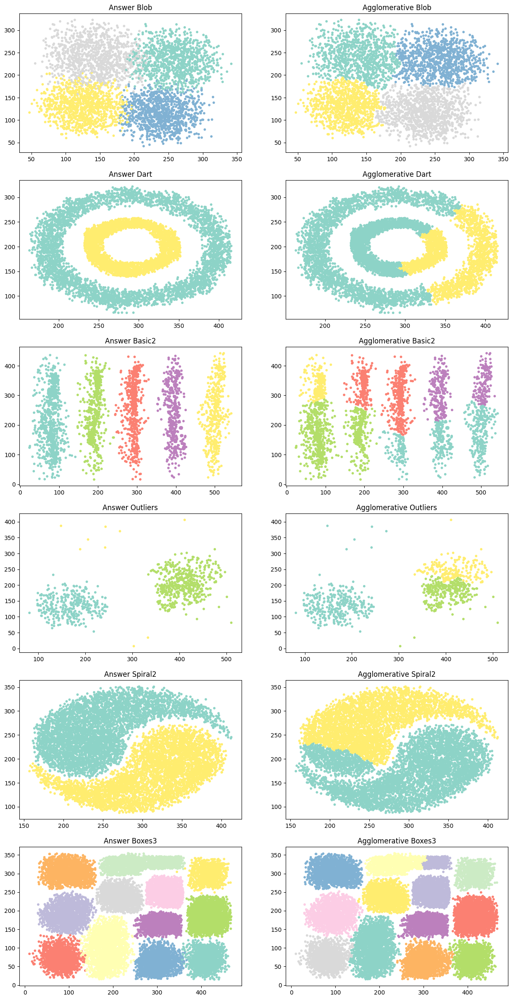

In [29]:
#Agglomerative Clustering on all the datasets

from sklearn.cluster import AgglomerativeClustering
df_blob_agg = blob_df.copy()
df_dart_agg = dart_df.copy()
df_basic_agg = basic2_df.copy()
df_outliers_agg = outliers_df.copy()
df_spiral2_agg = spiral2_df.copy()
df_boxes3_agg = boxes3_df.copy()

df_blob_agg.drop(['color'], axis=1, inplace=True)
df_dart_agg.drop(['color'], axis=1, inplace=True)
df_basic_agg.drop(['color'], axis=1, inplace=True)
df_outliers_agg.drop(['color'], axis=1, inplace=True)
df_spiral2_agg.drop(['color'], axis=1, inplace=True)
df_boxes3_agg.drop(['color'], axis=1, inplace=True)

agg_blob = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')
agg_dart = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
agg_basic = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
agg_outliers = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
agg_spiral2 = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
agg_boxes3 = AgglomerativeClustering(n_clusters=12, affinity='euclidean', linkage='ward')

y_agg_blob = agg_blob.fit_predict(df_blob_agg)
y_agg_dart = agg_dart.fit_predict(df_dart_agg)
y_agg_basic = agg_basic.fit_predict(df_basic_agg)
y_agg_outliers = agg_outliers.fit_predict(df_outliers_agg)
y_agg_spiral2 = agg_spiral2.fit_predict(df_spiral2_agg)
y_agg_boxes3 = agg_boxes3.fit_predict(df_boxes3_agg)

#visualizing the result
fig,axes=plt.subplots(6,2,figsize=(15,30))

axes[0,0].scatter(blob_df['x'], blob_df['y'], c=blob_df['color'], s=10, cmap = "Set3")
axes[0,0].set_title("Answer Blob");
axes[0,1].scatter(df_blob_agg['x'], df_blob_agg['y'], c=y_agg_blob, s=10, cmap = "Set3")
axes[0,1].set_title("Agglomerative Blob");

axes[1,0].scatter(dart_df['x'], dart_df['y'], c=dart_df['color'], s=10, cmap = "Set3")
axes[1,0].set_title("Answer Dart");

axes[1,1].scatter(df_dart_agg['x'], df_dart_agg['y'], c=y_agg_dart, s=10, cmap = "Set3")
axes[1,1].set_title("Agglomerative Dart");

axes[2,0].scatter(basic2_df['x'], basic2_df['y'], c=basic2_df['color'], s=10, cmap = "Set3")
axes[2,0].set_title("Answer Basic2");

axes[2,1].scatter(df_basic_agg['x'], df_basic_agg['y'], c=y_agg_basic, s=10, cmap = "Set3")
axes[2,1].set_title("Agglomerative Basic2");

axes[3,0].scatter(outliers_df['x'], outliers_df['y'], c=outliers_df['color'], s=10, cmap = "Set3")
axes[3,0].set_title("Answer Outliers");

axes[3,1].scatter(df_outliers_agg['x'], df_outliers_agg['y'], c=y_agg_outliers, s=10, cmap = "Set3")
axes[3,1].set_title("Agglomerative Outliers");

axes[4,0].scatter(spiral2_df['x'], spiral2_df['y'], c=spiral2_df['color'], s=10, cmap = "Set3")
axes[4,0].set_title("Answer Spiral2");

axes[4,1].scatter(df_spiral2_agg['x'], df_spiral2_agg['y'], c=y_agg_spiral2, s=10, cmap = "Set3")
axes[4,1].set_title("Agglomerative Spiral2");

axes[5,0].scatter(boxes3_df['x'], boxes3_df['y'], c=boxes3_df['color'], s=10, cmap = "Set3")
axes[5,0].set_title("Answer Boxes3");

axes[5,1].scatter(df_boxes3_agg['x'], df_boxes3_agg['y'], c=y_agg_boxes3, s=10, cmap = "Set3")
axes[5,1].set_title("Agglomerative Boxes3");


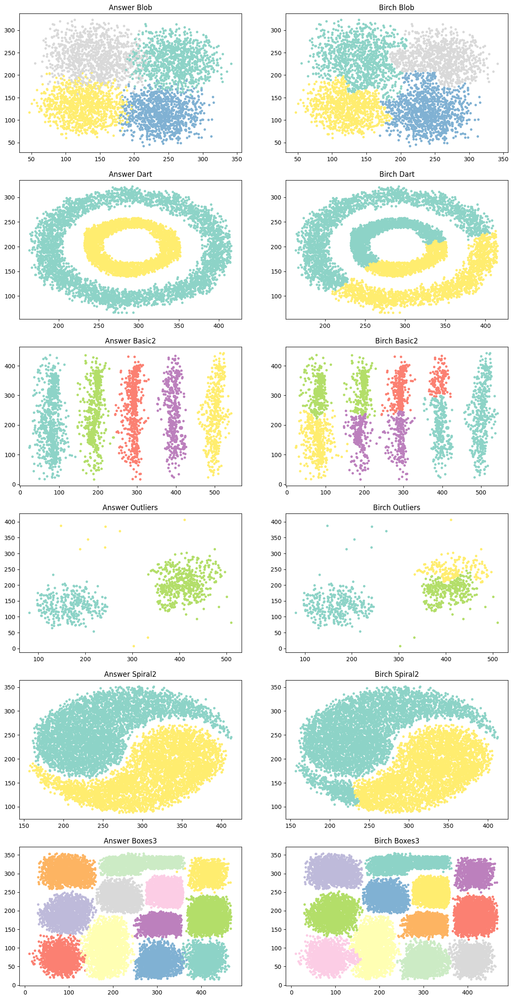

In [30]:
#implement birch clustering on all the datasets

from sklearn.cluster import Birch
df_blob_birch = blob_df.copy()
df_dart_birch = dart_df.copy()
df_basic_birch = basic2_df.copy()
df_outliers_birch = outliers_df.copy()
df_spiral2_birch = spiral2_df.copy()
df_boxes3_birch = boxes3_df.copy()

df_blob_birch.drop(['color'], axis=1, inplace=True)
df_dart_birch.drop(['color'], axis=1, inplace=True)
df_basic_birch.drop(['color'], axis=1, inplace=True)
df_outliers_birch.drop(['color'], axis=1, inplace=True)
df_spiral2_birch.drop(['color'], axis=1, inplace=True)
df_boxes3_birch.drop(['color'], axis=1, inplace=True)

birch_blob = Birch(n_clusters=4)
birch_dart = Birch(n_clusters=2)
birch_basic = Birch(n_clusters=5)
birch_outliers = Birch(n_clusters=3)
birch_spiral2 = Birch(n_clusters=2)
birch_boxes3 = Birch(n_clusters=12)

y_birch_blob = birch_blob.fit_predict(df_blob_birch)
y_birch_dart = birch_dart.fit_predict(df_dart_birch)
y_birch_basic = birch_basic.fit_predict(df_basic_birch)
y_birch_outliers = birch_outliers.fit_predict(df_outliers_birch)
y_birch_spiral2 = birch_spiral2.fit_predict(df_spiral2_birch)
y_birch_boxes3 = birch_boxes3.fit_predict(df_boxes3_birch)

#visualizing the result
fig,axes=plt.subplots(6,2,figsize=(15,30))

axes[0,0].scatter(blob_df['x'], blob_df['y'], c=blob_df['color'], s=10, cmap = "Set3")
axes[0,0].set_title("Answer Blob");

axes[0,1].scatter(df_blob_birch['x'], df_blob_birch['y'], c=y_birch_blob, s=10, cmap = "Set3")
axes[0,1].set_title("Birch Blob");

axes[1,0].scatter(dart_df['x'], dart_df['y'], c=dart_df['color'], s=10, cmap = "Set3")
axes[1,0].set_title("Answer Dart");

axes[1,1].scatter(df_dart_birch['x'], df_dart_birch['y'], c=y_birch_dart, s=10, cmap = "Set3")
axes[1,1].set_title("Birch Dart");

axes[2,0].scatter(basic2_df['x'], basic2_df['y'], c=basic2_df['color'], s=10, cmap = "Set3")
axes[2,0].set_title("Answer Basic2");

axes[2,1].scatter(df_basic_birch['x'], df_basic_birch['y'], c=y_birch_basic, s=10, cmap = "Set3")
axes[2,1].set_title("Birch Basic2");

axes[3,0].scatter(outliers_df['x'], outliers_df['y'], c=outliers_df['color'], s=10, cmap = "Set3")
axes[3,0].set_title("Answer Outliers");

axes[3,1].scatter(df_outliers_birch['x'], df_outliers_birch['y'], c=y_birch_outliers, s=10, cmap = "Set3")
axes[3,1].set_title("Birch Outliers");

axes[4,0].scatter(spiral2_df['x'], spiral2_df['y'], c=spiral2_df['color'], s=10, cmap = "Set3")
axes[4,0].set_title("Answer Spiral2");

axes[4,1].scatter(df_spiral2_birch['x'], df_spiral2_birch['y'], c=y_birch_spiral2, s=10, cmap = "Set3")
axes[4,1].set_title("Birch Spiral2");

axes[5,0].scatter(boxes3_df['x'], boxes3_df['y'], c=boxes3_df['color'], s=10, cmap = "Set3")
axes[5,0].set_title("Answer Boxes3");

axes[5,1].scatter(df_boxes3_birch['x'], df_boxes3_birch['y'], c=y_birch_boxes3, s=10, cmap = "Set3")
axes[5,1].set_title("Birch Boxes3");


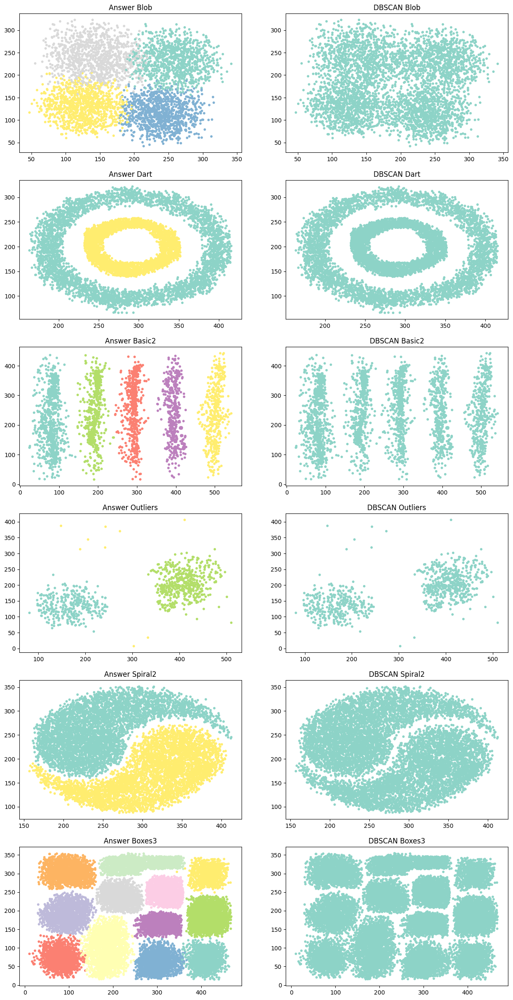

In [31]:
#implement dbscan clustering on all the datasets

from sklearn.cluster import DBSCAN
df_blob_dbscan = blob_df.copy()
df_dart_dbscan = dart_df.copy()
df_basic_dbscan = basic2_df.copy()
df_outliers_dbscan = outliers_df.copy()
df_spiral2_dbscan = spiral2_df.copy()
df_boxes3_dbscan = boxes3_df.copy()

df_blob_dbscan.drop(['color'], axis=1, inplace=True)
df_dart_dbscan.drop(['color'], axis=1, inplace=True)
df_basic_dbscan.drop(['color'], axis=1, inplace=True)
df_outliers_dbscan.drop(['color'], axis=1, inplace=True)
df_spiral2_dbscan.drop(['color'], axis=1, inplace=True)
df_boxes3_dbscan.drop(['color'], axis=1, inplace=True)

dbscan_blob = DBSCAN(eps=0.3, min_samples=10)
dbscan_dart = DBSCAN(eps=0.3, min_samples=10)
dbscan_basic = DBSCAN(eps=0.3, min_samples=10)
dbscan_outliers = DBSCAN(eps=0.3, min_samples=10)
dbscan_spiral2 = DBSCAN(eps=0.3, min_samples=10)
dbscan_boxes3 = DBSCAN(eps=0.3, min_samples=10)

y_dbscan_blob = dbscan_blob.fit_predict(df_blob_dbscan)
y_dbscan_dart = dbscan_dart.fit_predict(df_dart_dbscan)
y_dbscan_basic = dbscan_basic.fit_predict(df_basic_dbscan)
y_dbscan_outliers = dbscan_outliers.fit_predict(df_outliers_dbscan)
y_dbscan_spiral2 = dbscan_spiral2.fit_predict(df_spiral2_dbscan)
y_dbscan_boxes3 = dbscan_boxes3.fit_predict(df_boxes3_dbscan)

#visualizing the result
fig,axes=plt.subplots(6,2,figsize=(15,30))

axes[0,0].scatter(blob_df['x'], blob_df['y'], c=blob_df['color'], s=10, cmap = "Set3")
axes[0,0].set_title("Answer Blob");

axes[0,1].scatter(df_blob_dbscan['x'], df_blob_dbscan['y'], c=y_dbscan_blob, s=10, cmap = "Set3")
axes[0,1].set_title("DBSCAN Blob");

axes[1,0].scatter(dart_df['x'], dart_df['y'], c=dart_df['color'], s=10, cmap = "Set3")
axes[1,0].set_title("Answer Dart");

axes[1,1].scatter(df_dart_dbscan['x'], df_dart_dbscan['y'], c=y_dbscan_dart, s=10, cmap = "Set3")
axes[1,1].set_title("DBSCAN Dart");

axes[2,0].scatter(basic2_df['x'], basic2_df['y'], c=basic2_df['color'], s=10, cmap = "Set3")
axes[2,0].set_title("Answer Basic2");

axes[2,1].scatter(df_basic_dbscan['x'], df_basic_dbscan['y'], c=y_dbscan_basic, s=10, cmap = "Set3")
axes[2,1].set_title("DBSCAN Basic2");

axes[3,0].scatter(outliers_df['x'], outliers_df['y'], c=outliers_df['color'], s=10, cmap = "Set3")
axes[3,0].set_title("Answer Outliers");

axes[3,1].scatter(df_outliers_dbscan['x'], df_outliers_dbscan['y'], c=y_dbscan_outliers, s=10, cmap = "Set3")
axes[3,1].set_title("DBSCAN Outliers");

axes[4,0].scatter(spiral2_df['x'], spiral2_df['y'], c=spiral2_df['color'], s=10, cmap = "Set3")
axes[4,0].set_title("Answer Spiral2");

axes[4,1].scatter(df_spiral2_dbscan['x'], df_spiral2_dbscan['y'], c=y_dbscan_spiral2, s=10, cmap = "Set3")
axes[4,1].set_title("DBSCAN Spiral2");

axes[5,0].scatter(boxes3_df['x'], boxes3_df['y'], c=boxes3_df['color'], s=10, cmap = "Set3")
axes[5,0].set_title("Answer Boxes3");

axes[5,1].scatter(df_boxes3_dbscan['x'], df_boxes3_dbscan['y'], c=y_dbscan_boxes3, s=10, cmap = "Set3")
axes[5,1].set_title("DBSCAN Boxes3");
